In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.ioff();

import os

import math

import librosa
import librosa.display

import IPython

from IPython.display import Audio

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import scale, LabelEncoder, StandardScaler, minmax_scale

In [96]:
meta_data = pd.read_csv('Source/UrbanSound8K/metadata/UrbanSound8K.csv')

In [97]:
meta_data

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


In [100]:
meta_data[meta_data['slice_file_name'] == '134717-0-0-5.wav']

,slice_file_name,fsID,start,end,salience,fold,classID,class
1403,134717-0-0-5.wav,134717,2.5,6.5,1,1,0,air_conditioner


In [95]:
meta_data.sort_values(by = ['classID', 'salience']).sample(40).sort_values(by = 'classID')

,slice_file_name,fsID,start,end,salience,fold,classID,class
991,55018-0-0-162.wav,121286,4.500000,8.500000,1,5,0,air_conditioner
1877,55018-0-0-162.wav,146709,1.500000,5.500000,1,4,0,air_conditioner
3421,55018-0-0-162.wav,170022,9.042850,13.042850,1,8,0,air_conditioner
6860,55018-0-0-162.wav,57320,11.000000,15.000000,2,1,0,air_conditioner
1640,55018-0-0-162.wav,143115,39.187397,40.394711,2,6,1,car_horn
7553,55018-0-0-162.wav,72259,230.938833,234.938833,2,5,1,car_horn
7695,55018-0-0-162.wav,7389,164.261242,168.261242,2,4,1,car_horn
7426,55018-0-0-162.wav,71173,10.500000,14.500000,2,5,2,children_playing
8206,55018-0-0-162.wav,82368,0.500000,4.500000,1,6,2,children_playing
5383,55018-0-0-162.wav,204067,14.500000,18.500000,1,9,2,children_playing


In [ ]:

slice_file_name	fsID	start	end	salience	        fold	     classID	``    class
3953	177742-0-0-178.wav	177742	89.000000	93.000000	2	3	0	air_conditioner
4791	189988-0-0-5.wav	189988	2.500000	6.500000	1	9	0	air_conditioner

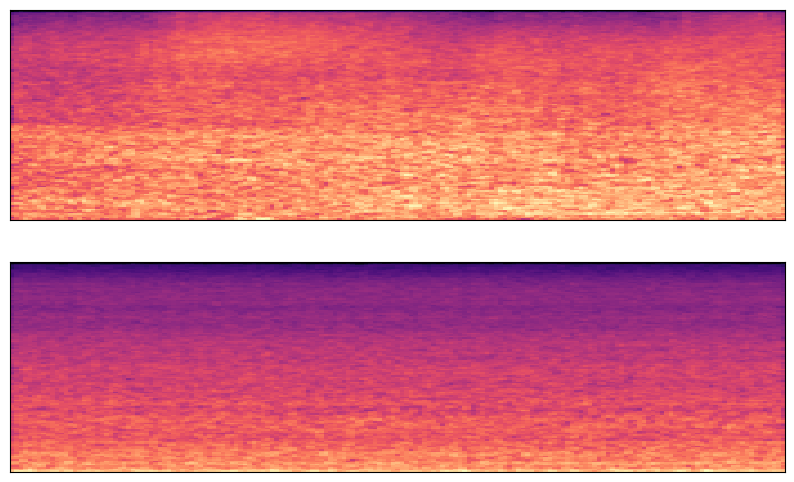

In [91]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold3/177742-0-0-178.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6), nrows = 2)

S = librosa.feature.melspectrogram(y=y, sr=sr)
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max), ax = ax[0])

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/189988-0-0-5.wav')

y = np.resize(y, 88200)


S = librosa.feature.melspectrogram(y=y, sr=sr)
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max), ax = ax[1])
plt.show()

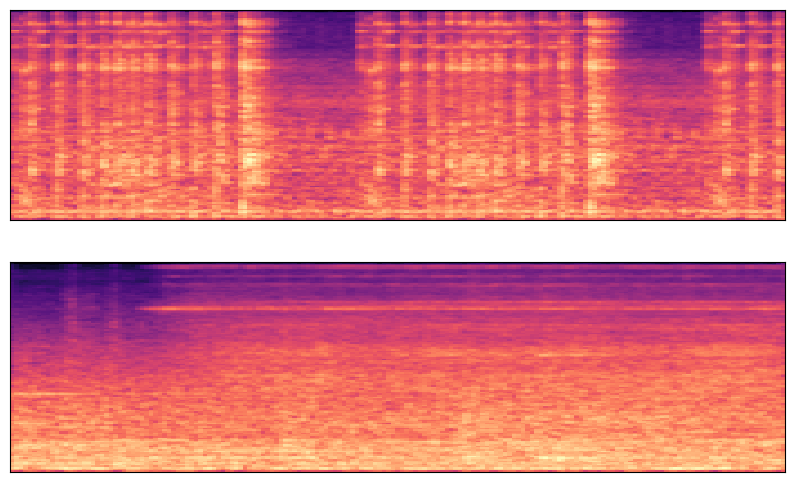

In [92]:
#jackhammer salience 1

y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/162134-7-6-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6), nrows = 2)

S = librosa.feature.melspectrogram(y=y, sr=sr)
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max), ax = ax[0])


#jackhammer salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold4/148463-7-3-9.wav')

y = np.resize(y, 88200)


S = librosa.feature.melspectrogram(y=y, sr=sr)
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max), ax = ax[1])
plt.show()

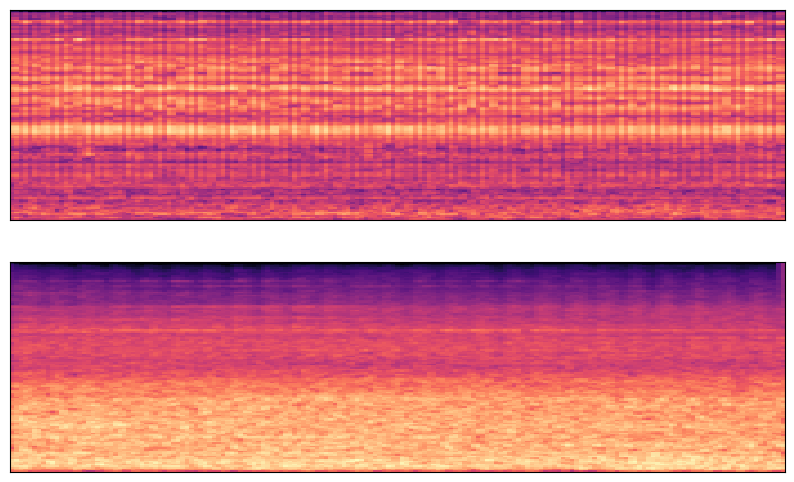

In [93]:
#jackhammer salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/105029-7-1-13.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6), nrows = 2)

S = librosa.feature.melspectrogram(y=y, sr=sr)
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max), ax = ax[0])

#jackhammer salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold2/203929-7-6-11.wav')

y = np.resize(y, 88200)


S = librosa.feature.melspectrogram(y=y, sr=sr)
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max), ax = ax[1])
plt.show()

In [ ]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/100648-1-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
plt.show()

In [39]:
meta_data.sort_values(by = ['classID'])

,slice_file_name,fsID,start,end,salience,fold,classID,class
4100,178686-0-0-66.wav,178686,33.000000,37.000000,2,5,0,air_conditioner
989,121286-0-0-7.wav,121286,3.500000,7.500000,1,5,0,air_conditioner
988,121286-0-0-6.wav,121286,3.000000,7.000000,1,5,0,air_conditioner
987,121286-0-0-5.wav,121286,2.500000,6.500000,1,5,0,air_conditioner
986,121286-0-0-4.wav,121286,2.000000,6.000000,1,5,0,air_conditioner
...,...,...,...,...,...,...,...,...
4931,194732-9-0-191.wav,194732,89.735978,93.735978,1,1,9,street_music
4930,194732-9-0-175.wav,194732,81.735978,85.735978,1,1,9,street_music
4929,194732-9-0-171.wav,194732,79.735978,83.735978,1,1,9,street_music
4935,194733-9-0-10.wav,194733,5.000000,9.000000,1,8,9,street_music


In [ ]:
'Source/UrbanSound8K/audio/fold5/100263-2-0-117.wav'

In [22]:
for idx, row in meta_data.iterrows():
    air_cond = row['fold']
    air_cond = row['slice_file_name']

In [23]:
air_cond

'99812-1-6-0.wav'

In [5]:
meta_data
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100263-2-0-117.wav')

In [31]:
classes = meta_data['class'].unique()

In [32]:
classes

array(['dog_bark', 'children_playing', 'car_horn', 'air_conditioner',
       'street_music', 'gun_shot', 'siren', 'engine_idling', 'jackhammer',
       'drilling'], dtype=object)

In [ ]:
for i in range(len(classes)):
    df[i] = 
    

In [ ]:
def extract_feature(file_name):
    audio_data, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    fea = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=50)
    scaled = np.mean(fea.T,axis=0)
    return np.array([scaled])


In [71]:
meta_data[]

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


In [55]:
salience_df = np.empty

In [56]:
salience_df

<function numpy.empty>

In [51]:
type(files_list)

list

In [69]:
files_list = []

for i in range(len(classes)):
    files_list.append(meta_data[(meta_data['class'] == classes[i]) & (meta_data['salience'] == 1)].head(1))
    
    files_list.append(meta_data[(meta_data['class'] == classes[i]) & (meta_data['salience'] == 2)].head(1))
    


In [70]:
files_list

[    slice_file_name    fsID  start       end  salience  fold  classID  \
 0  100032-3-0-0.wav  100032    0.0  0.317551         1     5        3   
 
       class  
 0  dog_bark  ,
      slice_file_name    fsID     start       end  salience  fold  classID  \
 53  101281-3-0-0.wav  101281  0.341333  4.341333         2     6        3   
 
        class  
 53  dog_bark  ,
       slice_file_name    fsID  start   end  salience  fold  classID  \
 1  100263-2-0-117.wav  100263   58.5  62.5         1     5        2   
 
               class  
 1  children_playing  ,
        slice_file_name    fsID  start   end  salience  fold  classID  \
 262  104327-2-0-15.wav  104327    7.5  11.5         2     6        2   
 
                 class  
 262  children_playing  ,
       slice_file_name    fsID     start       end  salience  fold  classID  \
 875  118070-1-0-0.wav  118070  0.392887  0.617964         1     3        1   
 
         class  
 875  car_horn  ,
     slice_file_name    fsID     start   

In [35]:
salience_df

,slice_file_name,fsID,start,end,salience,fold,classID,class
196,103199-4-0-0.wav,103199,0.0,4.0,1,3,4,drilling


In [81]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100263-2-0-117.wav')

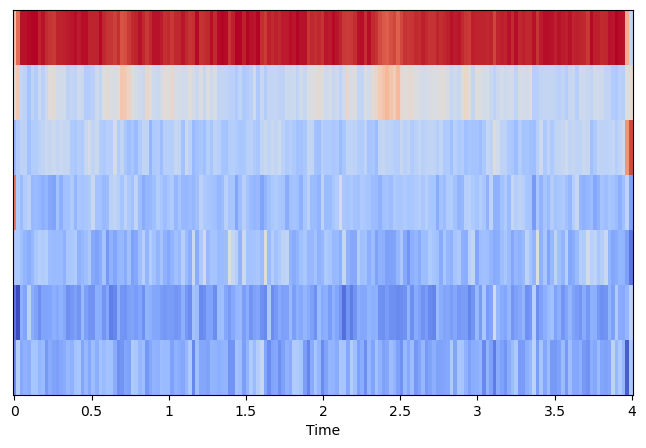

In [87]:
fig, ax = plt.subplots(figsize=(8,5))
contrast2 = librosa.feature.spectral_contrast(y=y, sr=sr, )
librosa.display.specshow(scale(contrast2), sr=sr, x_axis='time',  ax=ax)
plt.show()

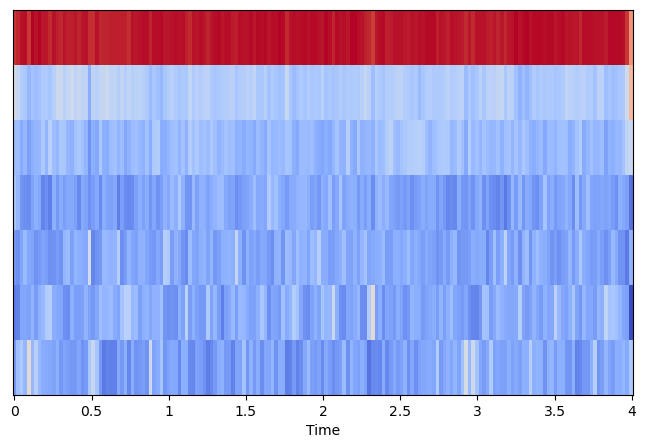

In [88]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold3/103199-4-0-0.wav')

fig, ax = plt.subplots(figsize=(8,5))
contrast2 = librosa.feature.spectral_contrast(y=y, sr=sr, )
librosa.display.specshow(scale(contrast2), sr=sr, x_axis='time',  ax=ax)
plt.show()

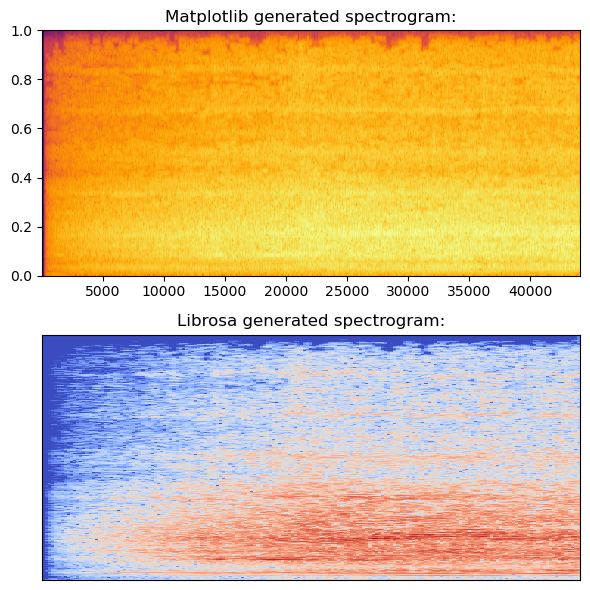

In [96]:
fig, ax = plt.subplots(figsize=(6,6), nrows=2)

ax[0].set_title('Matplotlib generated spectrogram:')
ax[0].specgram(y, cmap='inferno');

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl)

ax[1].set_title('Librosa generated spectrogram:')
fig.tight_layout()
plt.show()

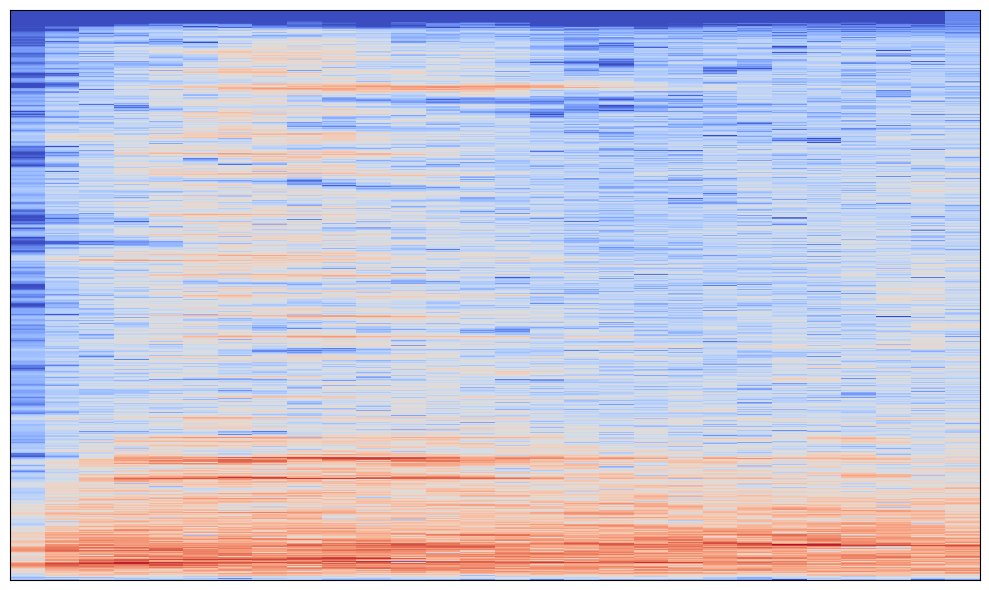

In [155]:
#children playing salience 2


y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/100648-1-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(y_stft))
librosa.display.specshow(ampl)

fig.tight_layout()
plt.show()

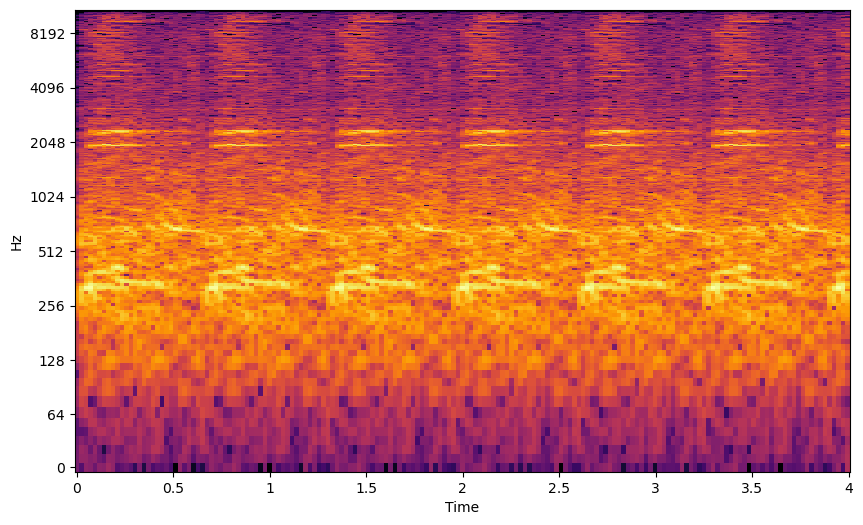

In [43]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/100648-1-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, x_axis='time',  y_axis='log',  ax=ax,  cmap='inferno')


plt.show()

In [46]:
meta_data[meta_data['slice_file_name'] == '101729-0-0-1.wav']

,slice_file_name,fsID,start,end,salience,fold,classID,class
67,101729-0-0-1.wav,101729,0.5,4.5,2,9,0,air_conditioner


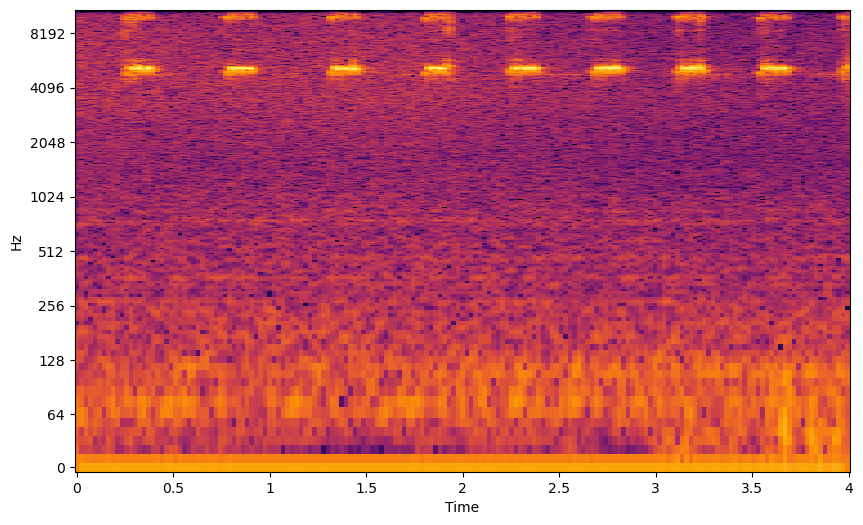

In [47]:
#air conditioner salience 2

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')
y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

spec = np.abs(librosa.stft(y, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
img = librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='log', cmap = 'inferno');

plt.show()

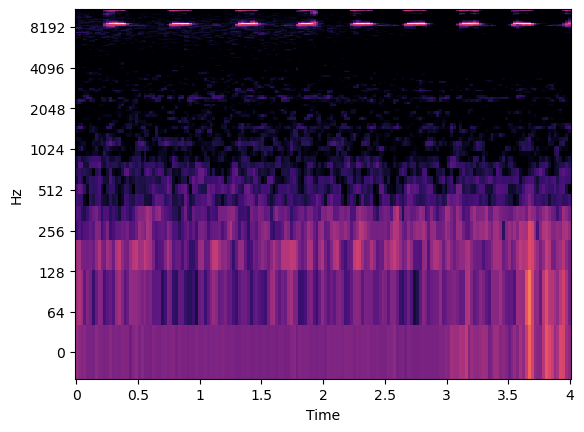

In [51]:
    #air conditioner salience 2

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')
y = np.resize(y, 88200)

    
fig, ax = plt.subplots()
S = librosa.feature.melspectrogram(y=y, sr=sr,)
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)
    
img = librosa.display.specshow(S_db_mel, x_axis='time' , y_axis='log', ax = ax)
plt.show()

In [ ]:
100852-0-0-1.wav

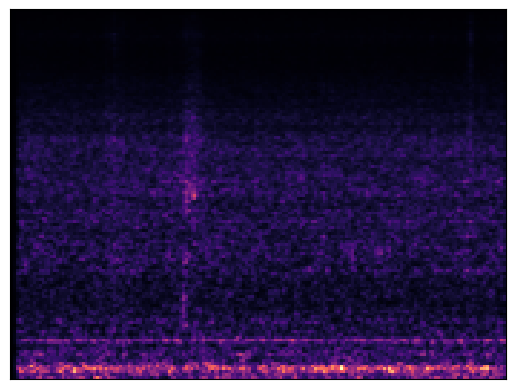

In [61]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100852-0-0-0.wav')


sgram = librosa.stft(y)


sgram_mag, _ = librosa.magphase(sgram)
mel_scale_sgram = librosa.feature.melspectrogram(S=sgram_mag, sr=sr)
librosa.display.specshow(mel_scale_sgram)
plt.show()

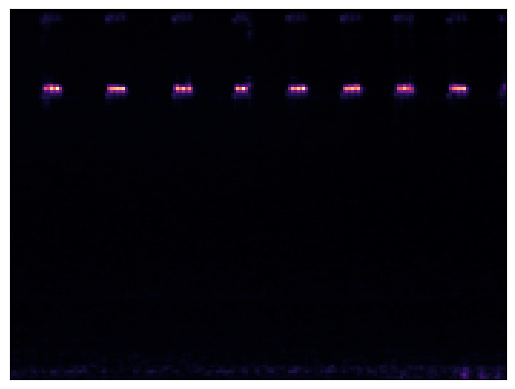

In [62]:

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')
sgram = librosa.stft(y)


sgram_mag, _ = librosa.magphase(sgram)
mel_scale_sgram = librosa.feature.melspectrogram(S=sgram_mag, sr=sr)
librosa.display.specshow(mel_scale_sgram)
plt.show()

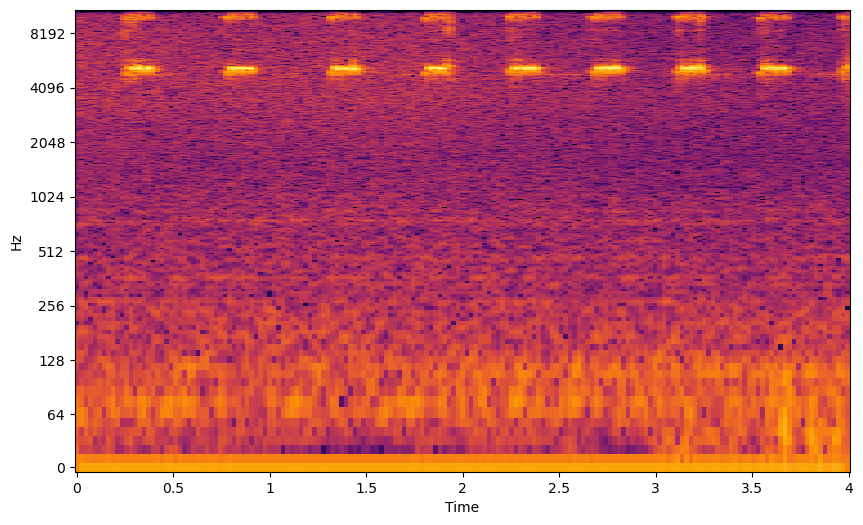

In [68]:
#air conditioner salience 2

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')
y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

spec = np.abs(librosa.stft(y, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
img = librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='log', cmap = 'inferno');

plt.show()

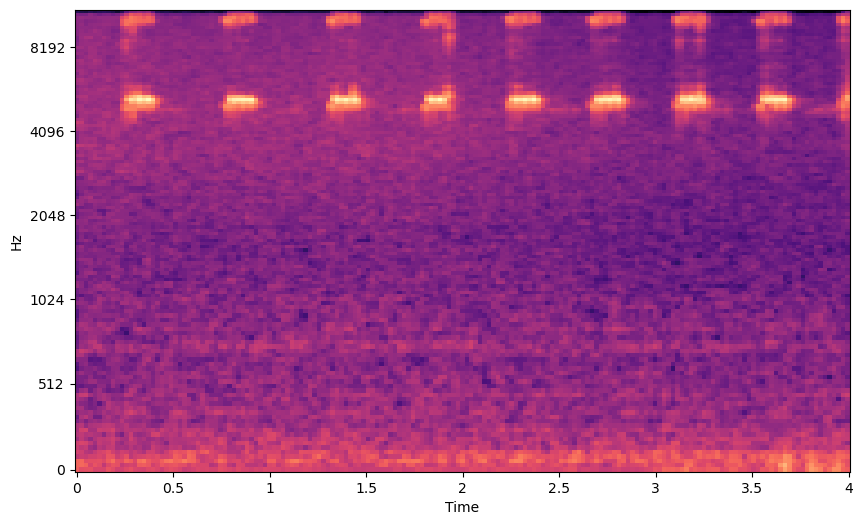

In [71]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')

fig, ax = plt.subplots(figsize=(10,6))

sgram = librosa.stft(y)

sgram_mag, _ = librosa.magphase(sgram)
mel_scale_sgram = librosa.feature.melspectrogram(S=sgram_mag, sr=sr)
#librosa.display.specshow(mel_scale_sgram)

# use the decibel scale to get the final Mel Spectrogram
mel_sgram = librosa.amplitude_to_db(mel_scale_sgram, ref=np.min)
librosa.display.specshow(mel_sgram, sr=sr, x_axis='time', y_axis='mel')
plt.show()

In [72]:
from PIL import Image


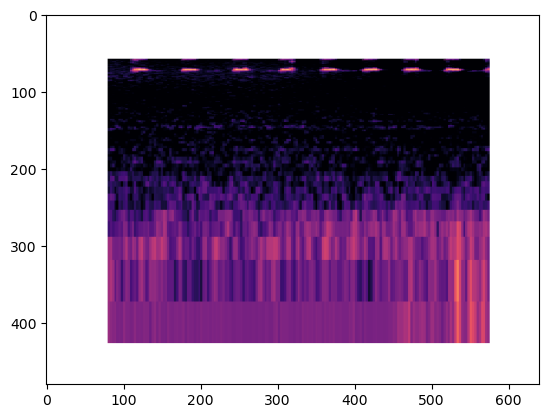

In [76]:
img = Image.open('Data/mel_train_85_15/0/101729-0-0-1.png')
plt.imshow(img)

plt.show()

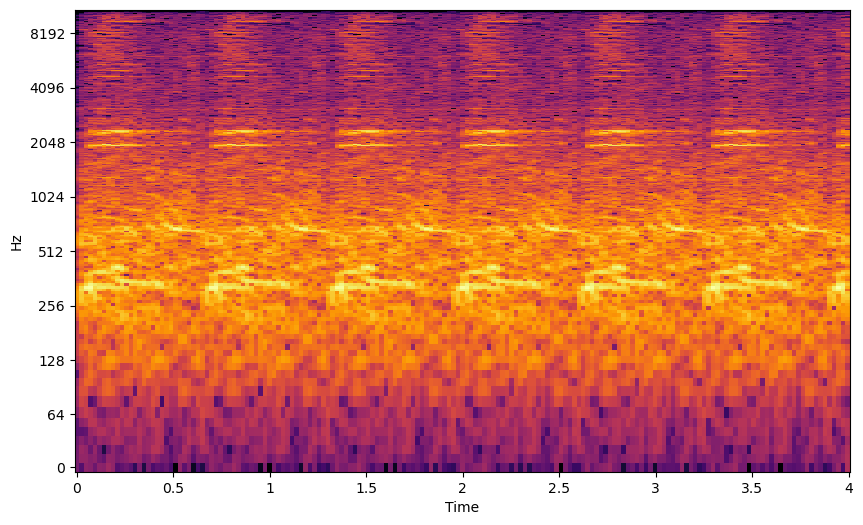

In [44]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/100648-1-0-0.wav')
y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

spec = np.abs(librosa.stft(y, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
img = librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='log', cmap = 'inferno');

plt.show()

In [79]:
feature = librosa.feature.mfcc(y=y,sr=sr,n_mfcc=50)


In [81]:
feature

array([[-187.71071   , -159.9708    , -165.92075   , ..., -185.98431   ,
        -165.47275   , -163.43633   ],
       [  -1.0444844 ,    5.180071  ,    5.772246  , ...,   12.074347  ,
         -16.923088  ,  -30.96873   ],
       [  23.908682  ,   21.641842  ,   18.924541  , ...,   44.19567   ,
          55.15394   ,   50.7556    ],
       ...,
       [   4.046859  ,    3.8808417 ,    4.92674   , ...,    5.1934643 ,
           4.3684726 ,    1.6029788 ],
       [  -0.4900267 ,    2.3928943 ,    3.8190308 , ...,   -3.8397794 ,
           0.19774774,    4.924268  ],
       [   9.28771   ,    7.916534  ,    5.808818  , ...,    2.7762046 ,
           9.5470495 ,    7.4904056 ]], dtype=float32)

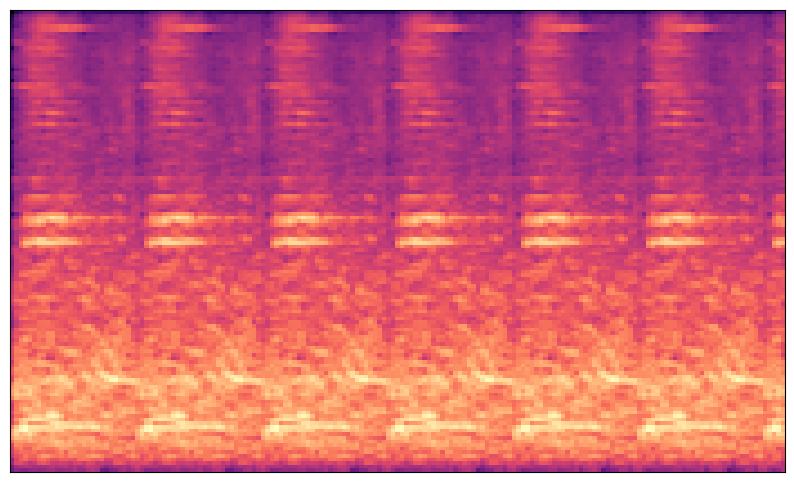

In [25]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/100648-1-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
plt.show()

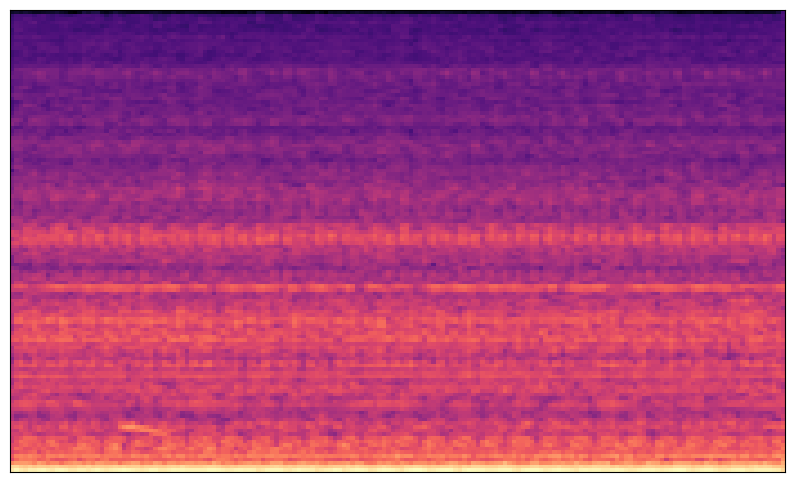

In [26]:
# engine_idling salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/102857-5-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
plt.show()

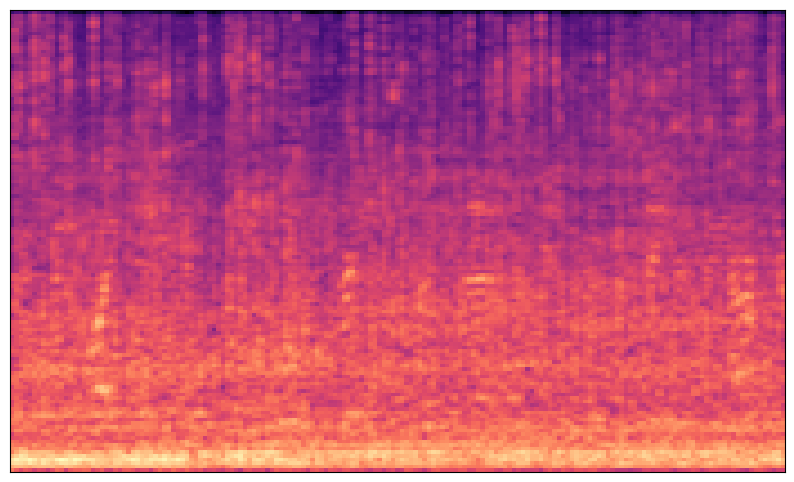

In [27]:
# engine_idling salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/103438-5-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
plt.show()

In [ ]:
       slice_file_name    fsID  start  end  salience  fold  classID  \
 122  102857-5-0-0.wav  102857    0.0  4.0         1    10        5   
 
              class  
 122  engine_idling  ,

       slice_file_name    fsID  start  end  salience  fold  classID  \
 259  103438-5-0-0.wav  103438    0.0  4.0         2    10        5   
 
              class  
 259  engine_idling  ,


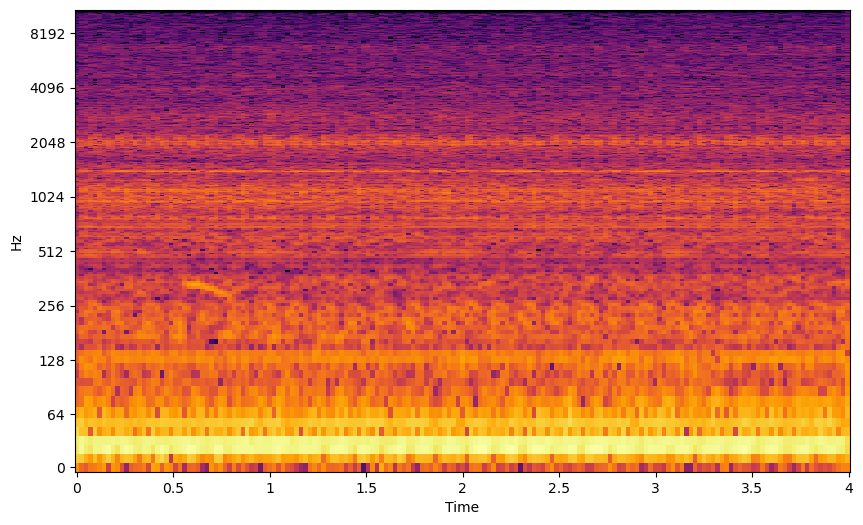

In [209]:
# engine_idling salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/102857-5-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

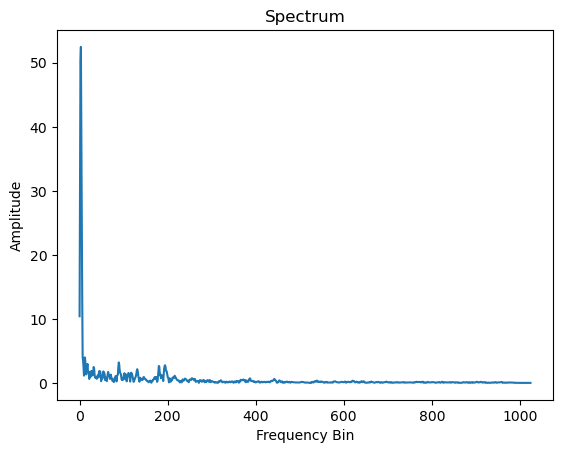

In [210]:
import numpy as np
n_fft = 2048
ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
plt.plot(ft);
plt.title('Spectrum');
plt.xlabel('Frequency Bin');
plt.ylabel('Amplitude');
plt.show()

In [202]:
Audio('Source/UrbanSound8K/audio/fold10/102857-5-0-0.wav')

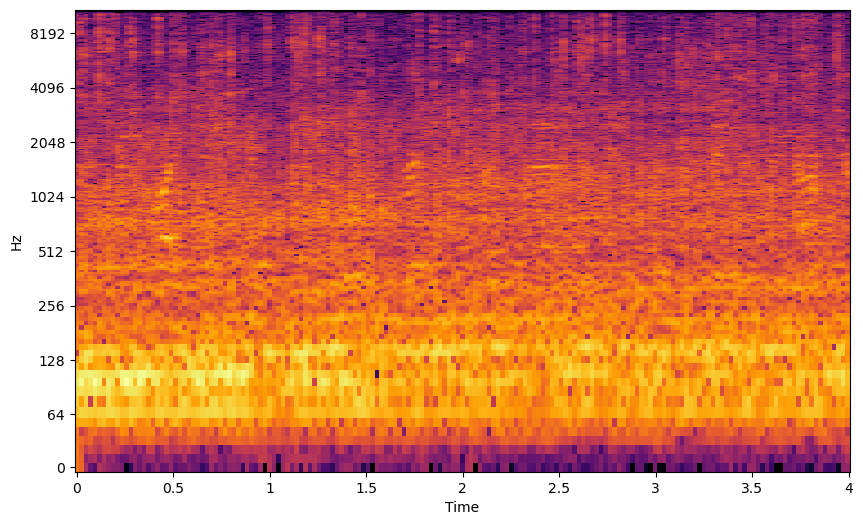

In [206]:
# engine_idling salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/103438-5-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

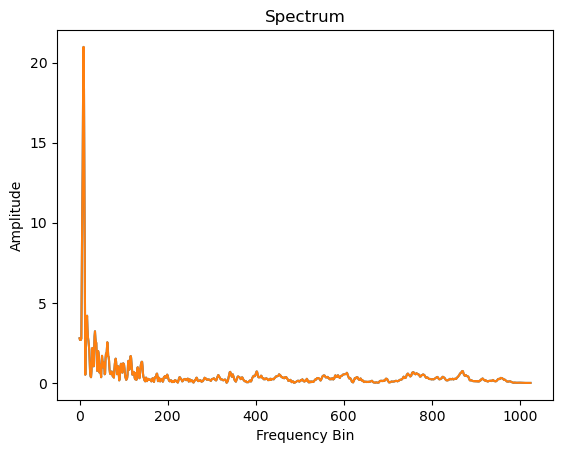

In [208]:
import numpy as np
n_fft = 2048
ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
plt.plot(ft);
plt.title('Spectrum');
plt.xlabel('Frequency Bin');
plt.ylabel('Amplitude');
plt.show()

In [203]:
Audio('Source/UrbanSound8K/audio/fold10/103438-5-0-0.wav')

In [ ]:
       slice_file_name    fsID     start       end  salience  fold  classID  \
 171  103074-7-0-0.wav  103074  3.341279  7.341279         1     1        7   
 
           class  
 171  jackhammer  ,

       slice_file_name    fsID     start       end  salience  fold  classID  \
 959  119809-7-0-0.wav  119809  0.467382  4.467382         2     9        7   
 
           class  
 959  jackhammer  ,


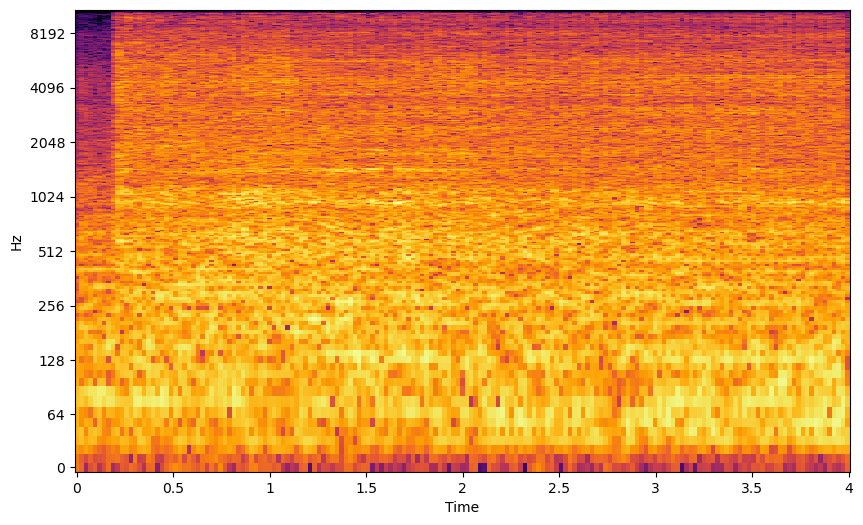

In [211]:
# jackhammer salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold1/103074-7-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

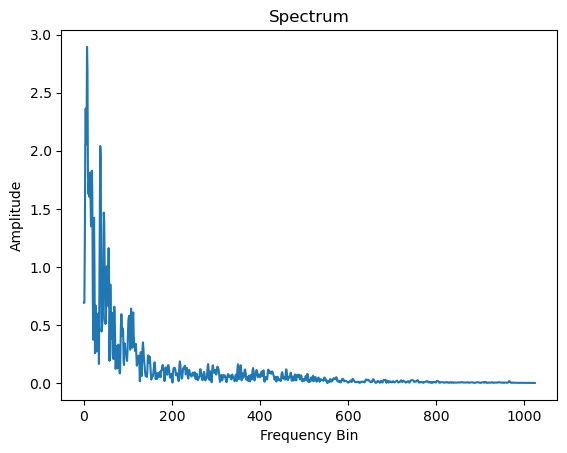

In [212]:
import numpy as np
n_fft = 2048
ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
plt.plot(ft);
plt.title('Spectrum');
plt.xlabel('Frequency Bin');
plt.ylabel('Amplitude');
plt.show()

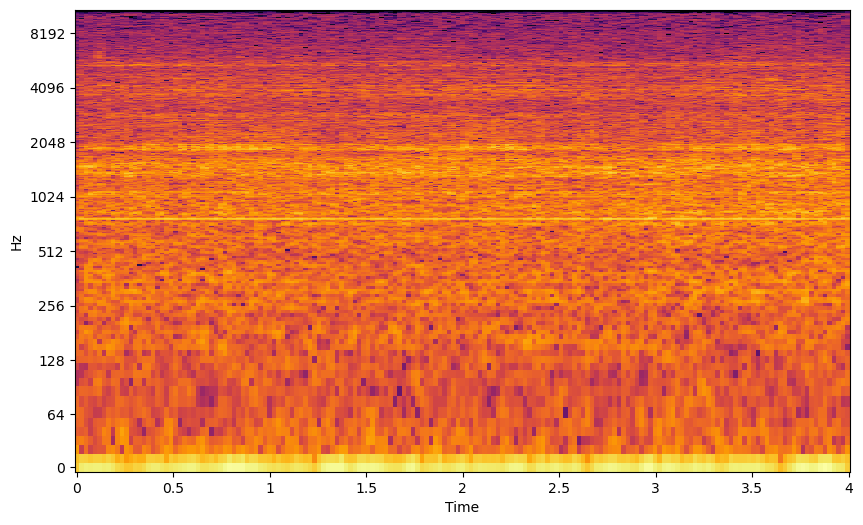

In [201]:
# jackhammer salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/119809-7-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

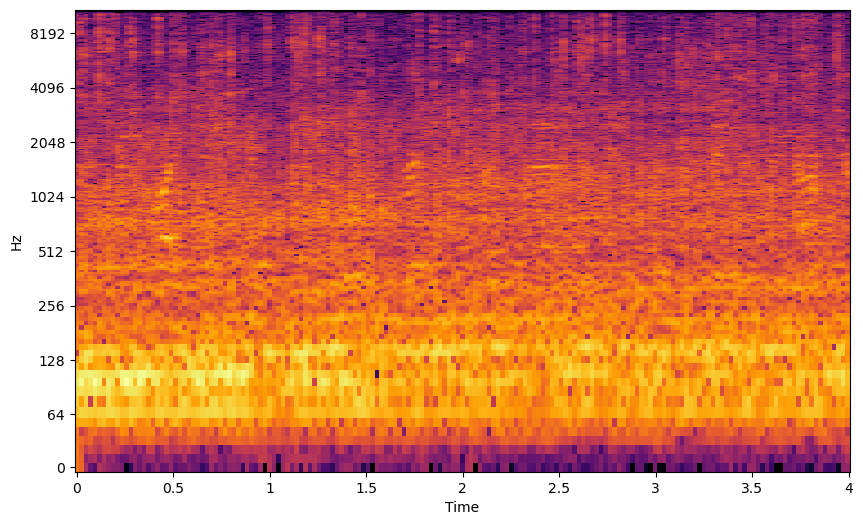

In [191]:
# car_horn salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/103438-5-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

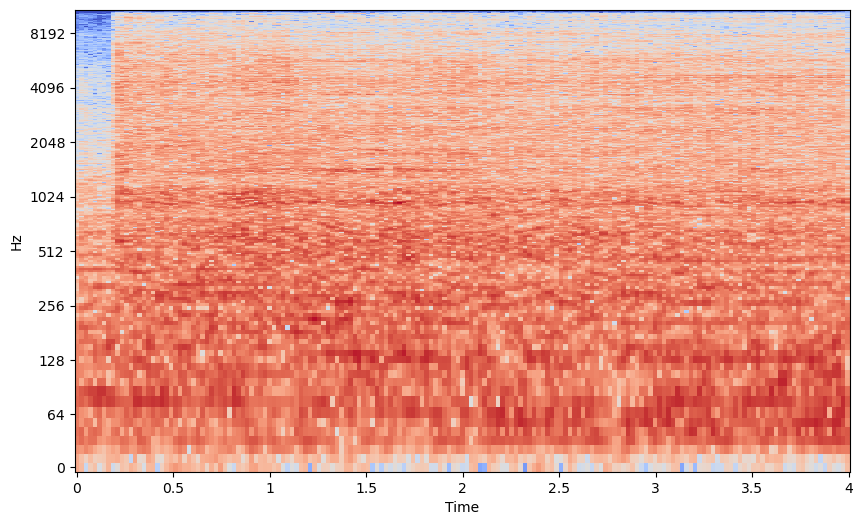

In [190]:
# car_horn salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold1/103074-7-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax)


plt.show()

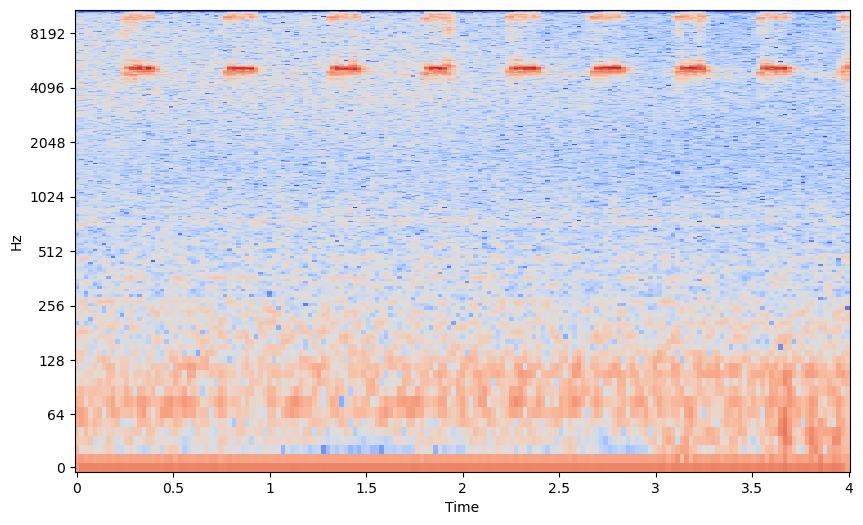

In [189]:
#Air Conditioner Salience 2

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax)

plt.show()


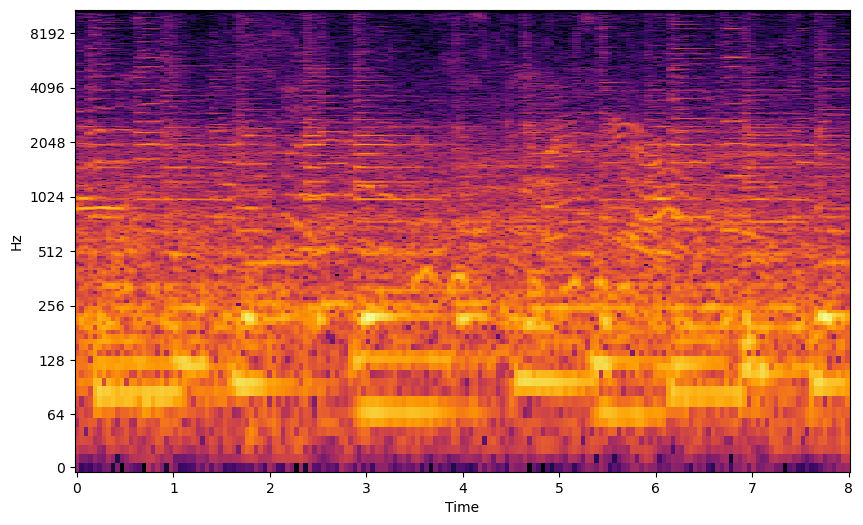

In [182]:

#Air Conditioner Salience 1

y, sr = librosa.load('Source/UrbanSound8K/audio/fold7/101848-9-0-0.wav')
y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=1024, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')

plt.show()

In [ ]:
# car_horn salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100852-0-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

In [ ]:
# car_horn salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100852-0-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

In [ ]:
       slice_file_name    fsID     start       end  salience  fold  classID  \
 875  118070-1-0-0.wav  118070  0.392887  0.617964         1     3        1   
 
         class  
 875  car_horn  ,
     slice_file_name    fsID     start       end  salience  fold  classID  \
 9  100648-1-0-0.wav  100648  4.823402  5.471927         2    10        1   

In [ ]:
#children playing salience 1

118070-1-0-0.wav   3

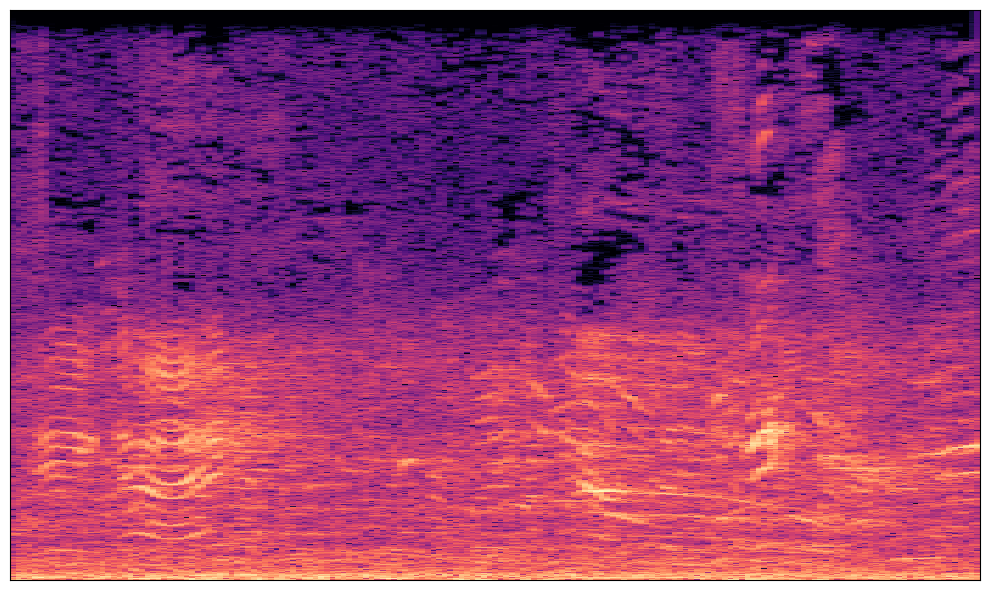

In [213]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100263-2-0-117.wav')

fig, ax = plt.subplots(figsize=(10,6))

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(y_stft))
librosa.display.specshow(ampl)

fig.tight_layout()
plt.show()

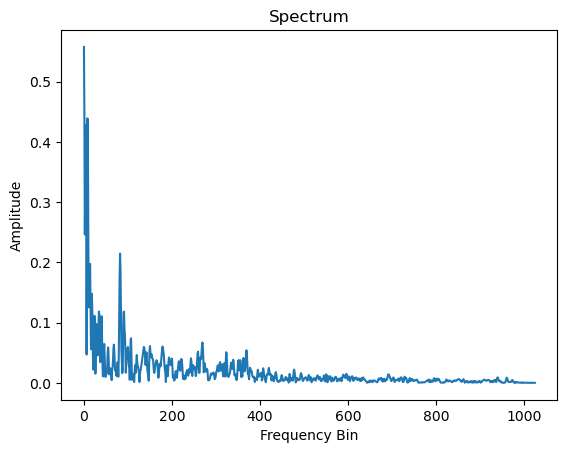

In [214]:
import numpy as np
n_fft = 2048
ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
plt.plot(ft);
plt.title('Spectrum');
plt.xlabel('Frequency Bin');
plt.ylabel('Amplitude');
plt.show()

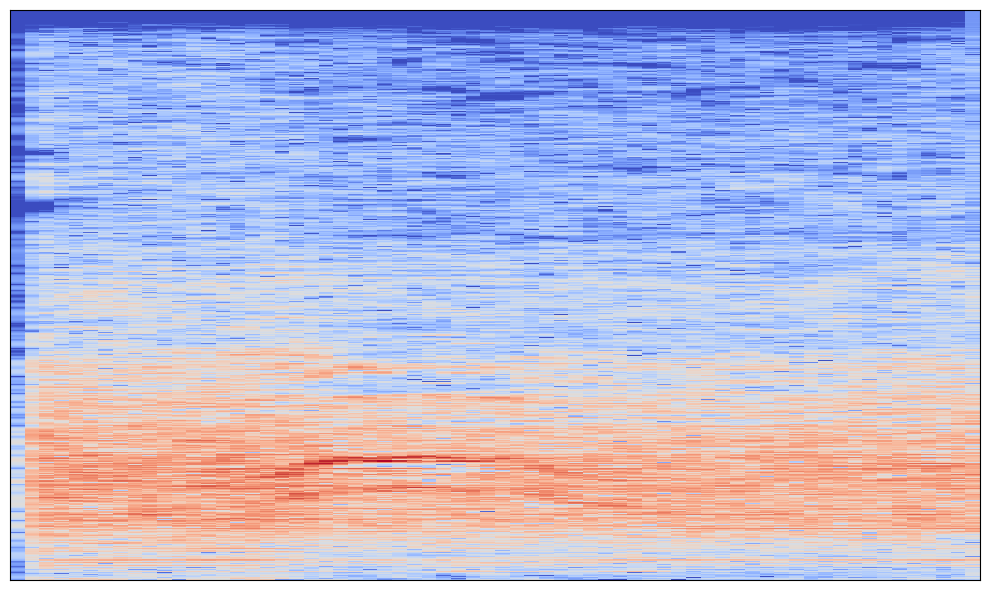

In [105]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold3/103199-4-1-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(y_stft))
librosa.display.specshow(ampl)

fig.tight_layout()
plt.show()

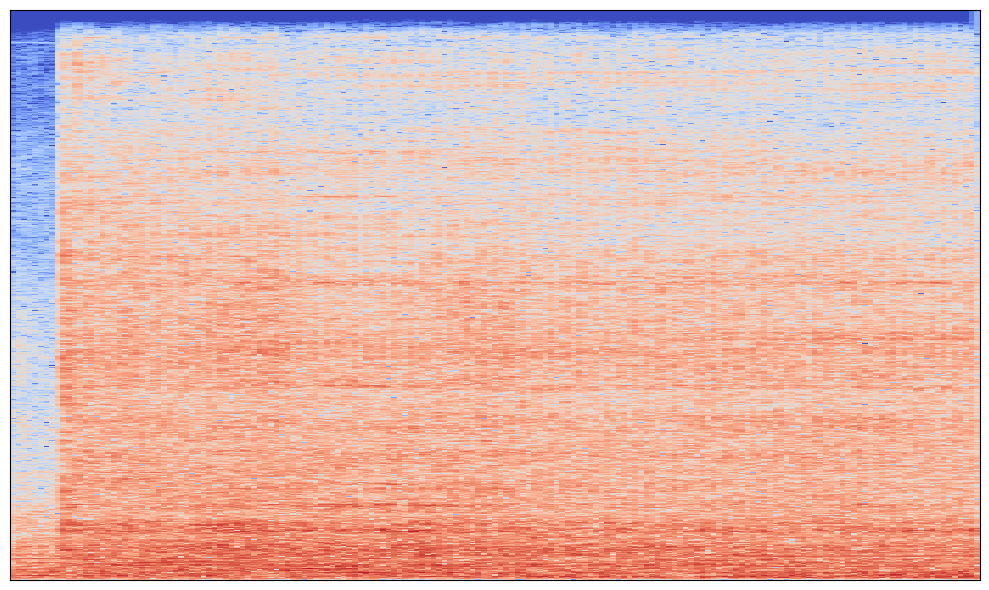

In [106]:


y, sr = librosa.load('Source/UrbanSound8K/audio/fold1/103074-7-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(y_stft))
librosa.display.specshow(ampl)

fig.tight_layout()
plt.show()

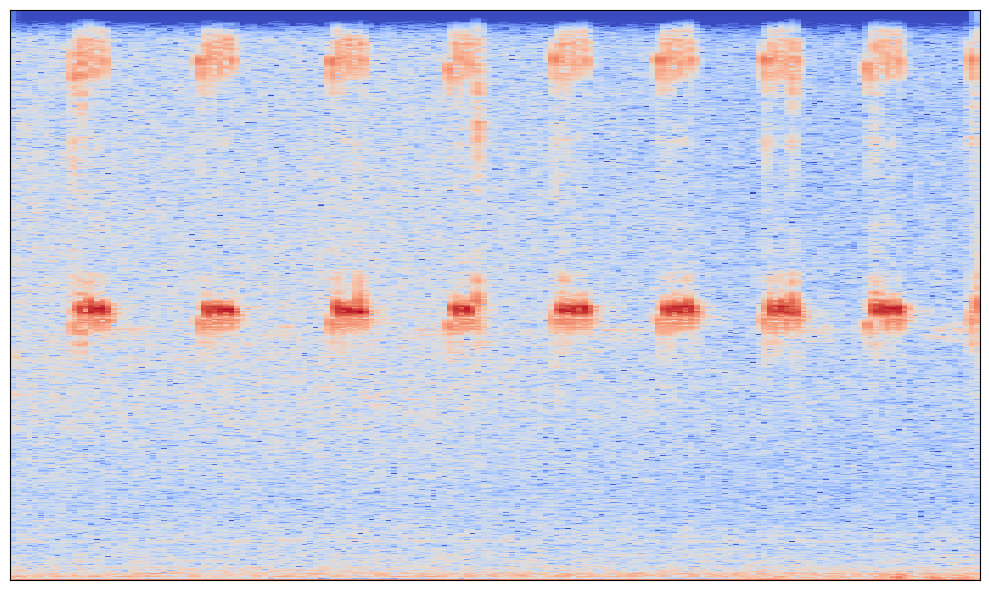

In [108]:
#Air Conditioner Salience 2

y, sr = librosa.load('Source/UrbanSound8K/audio/fold9/101729-0-0-1.wav')

fig, ax = plt.subplots(figsize=(10,6))

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(y_stft))
librosa.display.specshow(ampl)

fig.tight_layout()
plt.show()

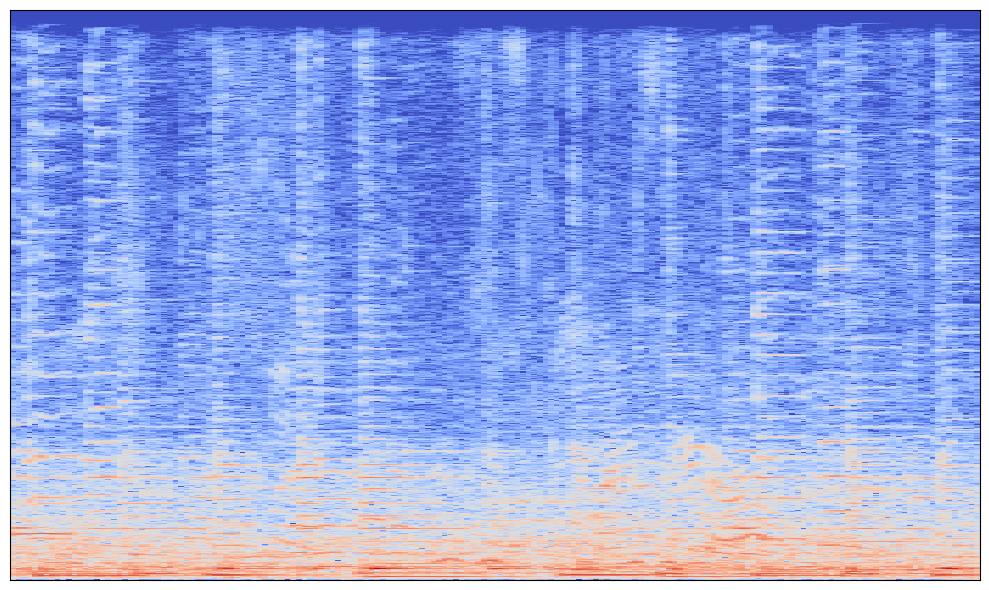

In [110]:
#Air Conditioner Salience 1

y, sr = librosa.load('Source/UrbanSound8K/audio/fold7/101848-9-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

y_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(y_stft))
librosa.display.specshow(ampl)

fig.tight_layout()
plt.show()

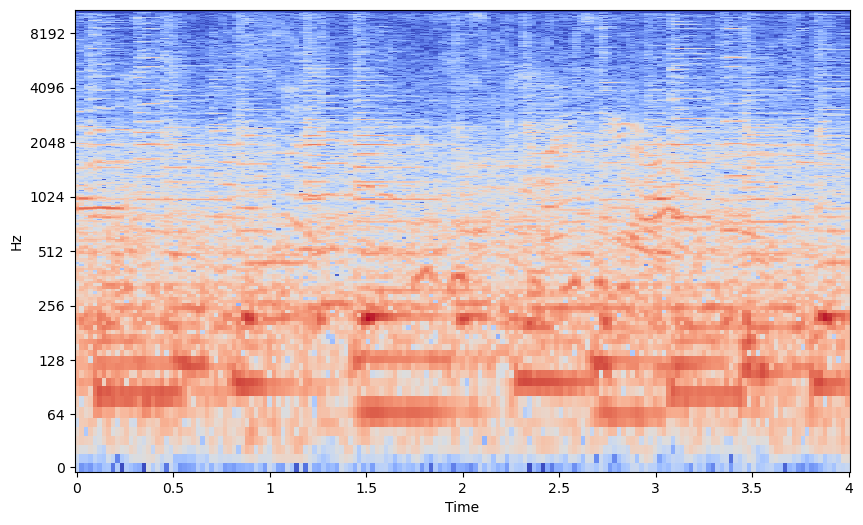

In [168]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold7/101848-9-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax)


plt.show()

In [ ]:
 875  car_horn  ,
     slice_file_name    fsID     start       end  salience  fold  classID  \
 9  100648-1-0-0.wav  100648  4.823402  5.471927         2    10        1   
 
       class  
 9  car_horn  ,
      slice_file_name    fsID  start  end  salience  fold  classID  \
 22  100852-0-0-0.wav  100852    0.0  4.0         1     5        0   


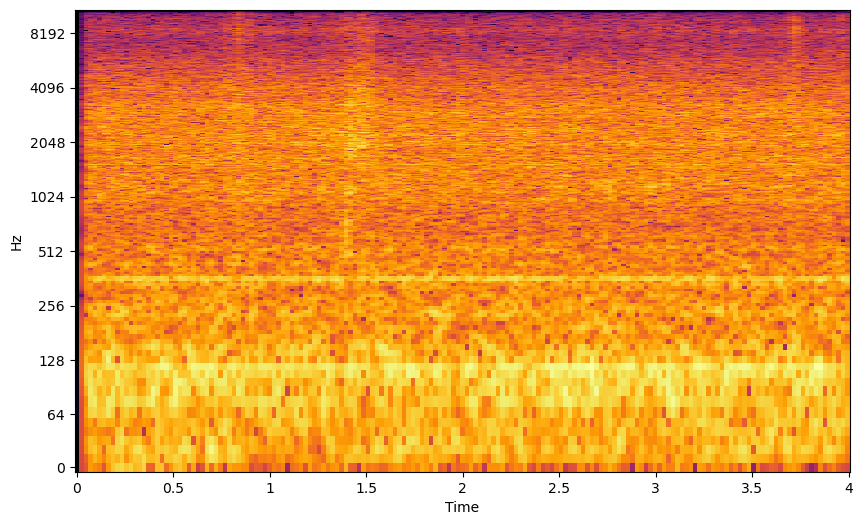

In [173]:
# car_horn salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold5/100852-0-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

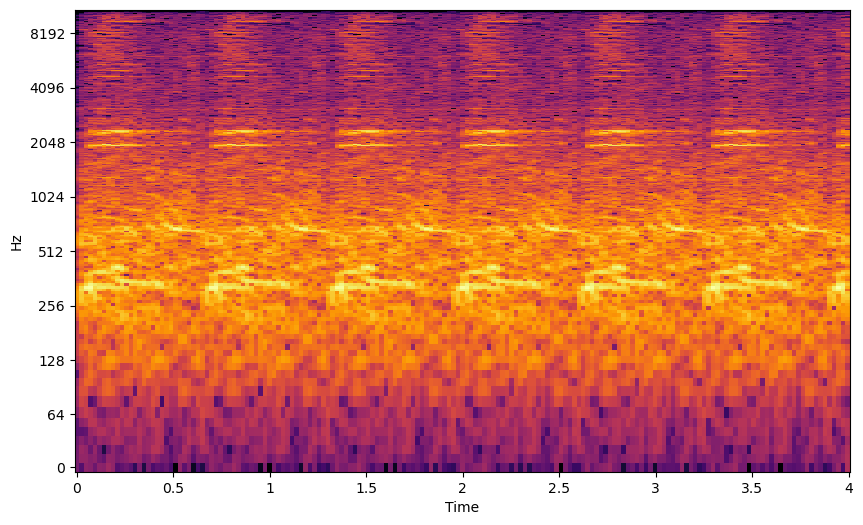

In [174]:
# car_horn salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/100648-1-0-0.wav')

y = np.resize(y, 88200)

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax, cmap = 'inferno')


plt.show()

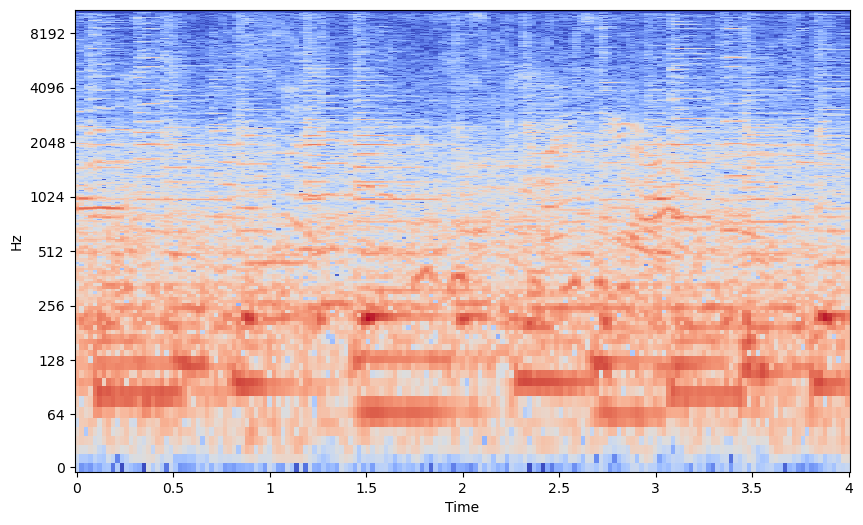

In [169]:
y, sr = librosa.load('Source/UrbanSound8K/audio/fold7/101848-9-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, x_axis='time',  y_axis='log',  ax=ax)


plt.show()

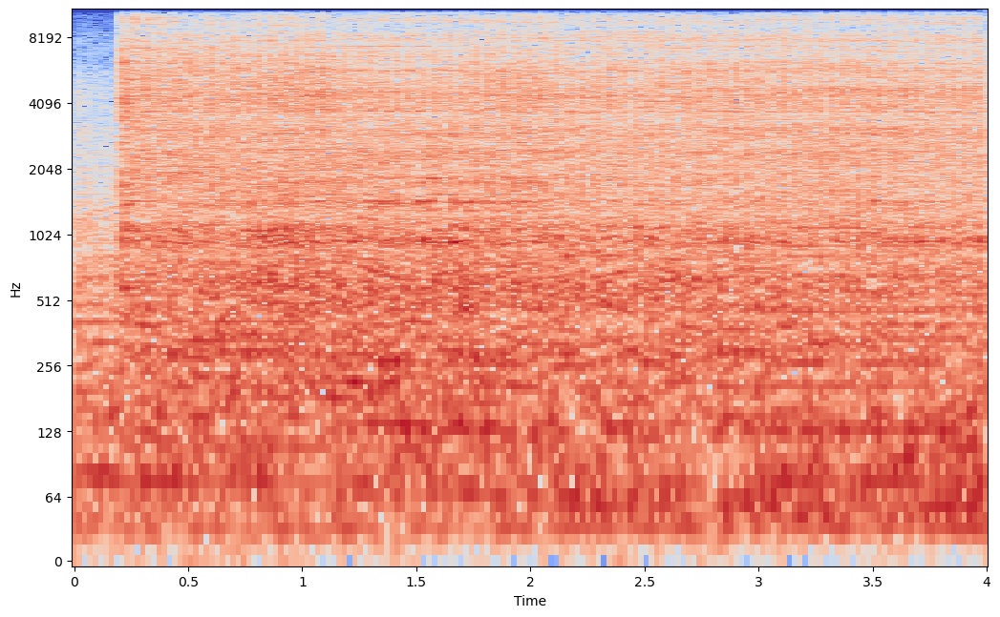

In [153]:


y, sr = librosa.load('Source/UrbanSound8K/audio/fold1/103074-7-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, sr=22050, hop_length=512, x_axis='time',  y_axis='log',  ax=ax)


fig.tight_layout(pad=-1)
plt.show()

In [123]:
sr

22050

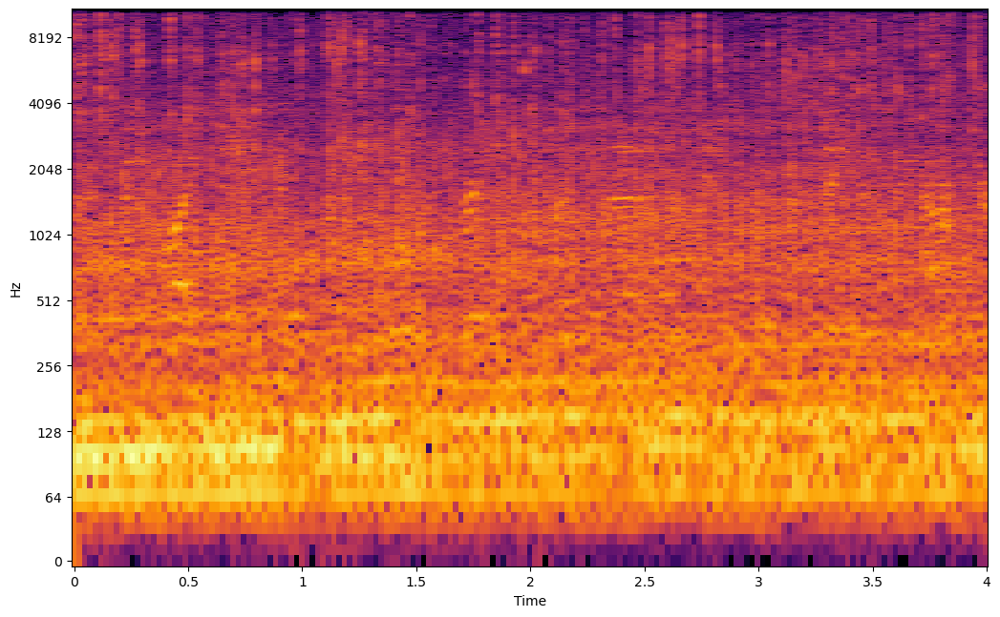

In [144]:
#engine idline Salience 2
y, sr = librosa.load('Source/UrbanSound8K/audio/fold10/103438-5-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))

x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, x_axis='time',  y_axis='log',  ax=ax, cmap='inferno')



fig.tight_layout(pad=-1)
plt.show()

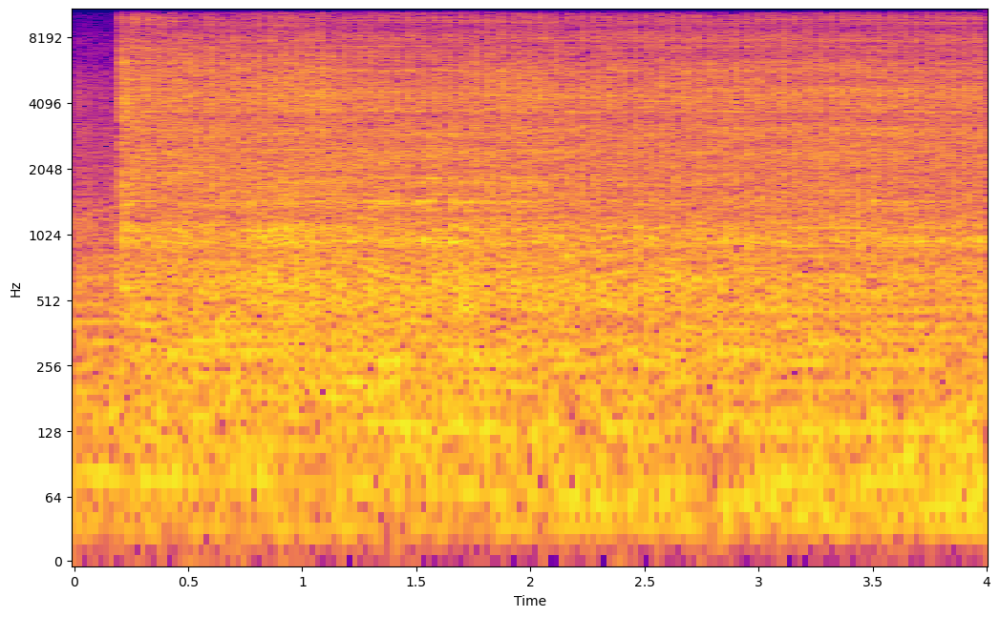

In [152]:
#engine idline Salience 1
y, sr = librosa.load('Source/UrbanSound8K/audio/fold1/103074-7-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))
x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, x_axis='time',  y_axis='log',  ax=ax, cmap='plasma')


fig.tight_layout(pad=-1)
plt.show()

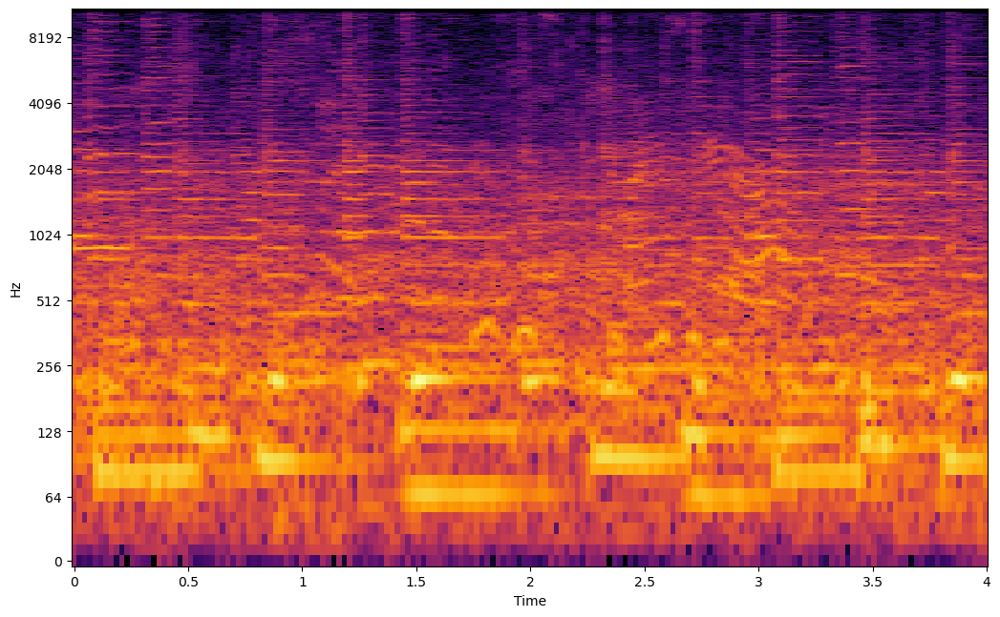

In [145]:
#Air Conditioner Salience 1

y, sr = librosa.load('Source/UrbanSound8K/audio/fold7/101848-9-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))
x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, x_axis='time',  y_axis='log',  ax=ax, cmap='inferno')


fig.tight_layout(pad=-1)
plt.show()

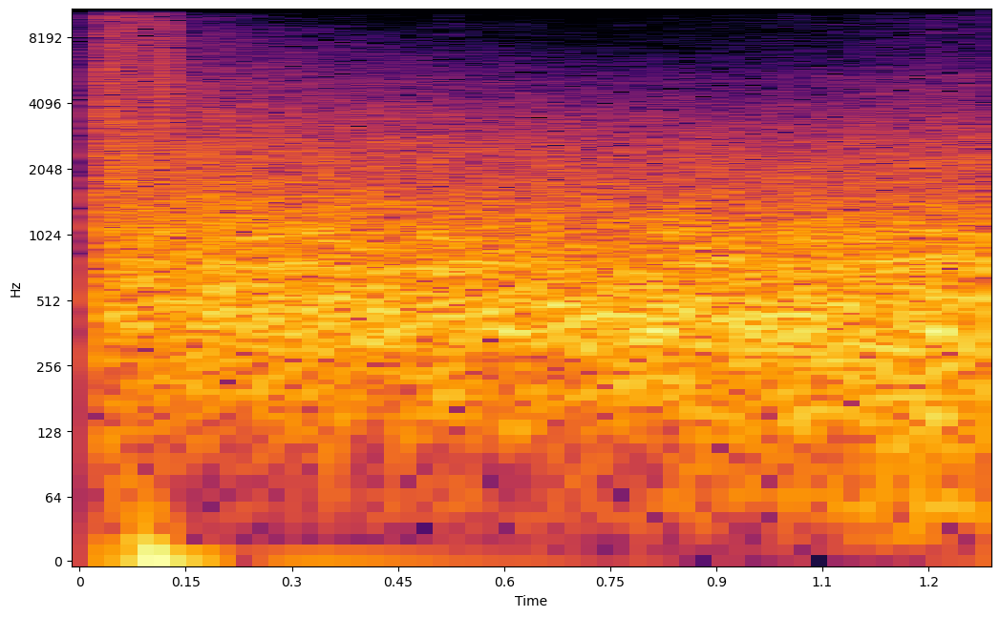

In [146]:
#Gun Shot Salience 2


#Air Conditioner Salience 1

y, sr = librosa.load('Source/UrbanSound8K/audio/fold7/135527-6-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))
x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
librosa.display.specshow(ampl, x_axis='time',  y_axis='log',  ax=ax, cmap='inferno')


fig.tight_layout(pad=-1)
plt.show()

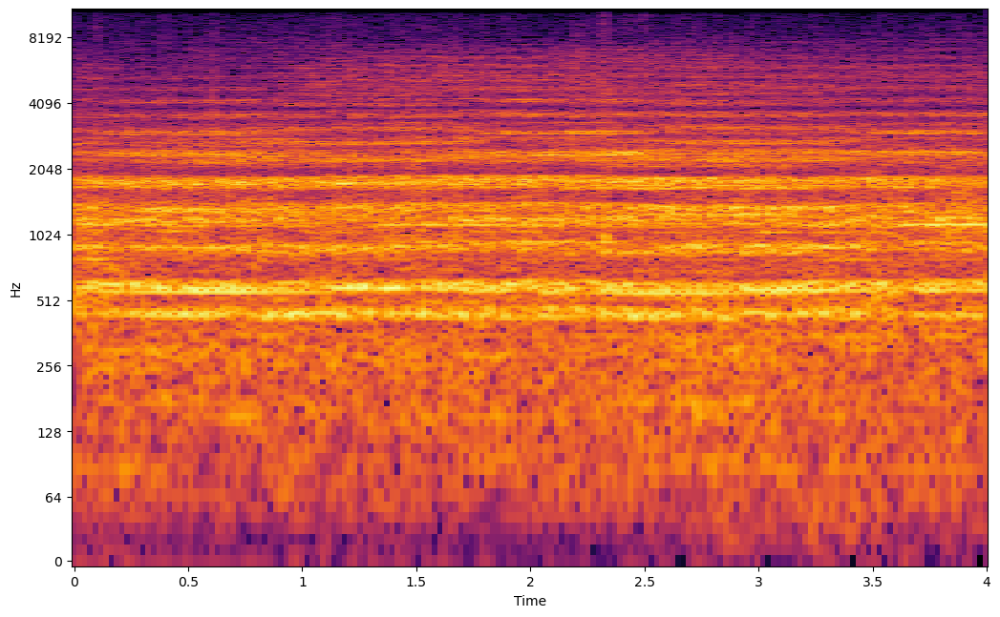

In [177]:
#Gun Shot Salience 1



y, sr = librosa.load('Source/UrbanSound8K/audio/fold2/102871-8-0-0.wav')

fig, ax = plt.subplots(figsize=(10,6))
x_stft = librosa.stft(y)
ampl = librosa.amplitude_to_db(abs(x_stft))
img = librosa.display.specshow(ampl, x_axis='time',  y_axis='log',  ax=ax, cmap='inferno')


fig.tight_layout(pad=-1)
plt.show()

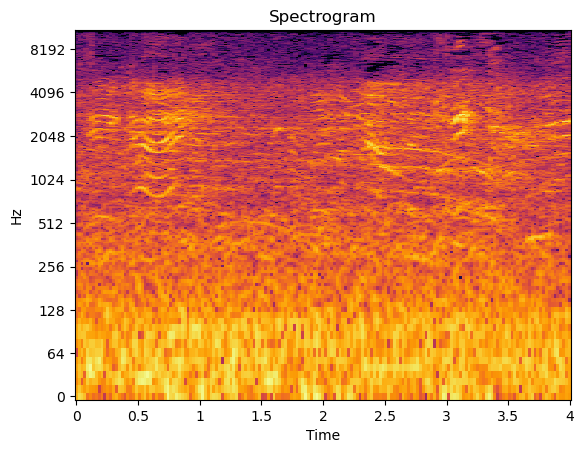

In [224]:
spec = np.abs(librosa.stft(y, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
img = librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='log', cmap = 'inferno');
plt.title('Spectrogram');
plt.show()

In [133]:
for idx, row in meta_data.iterrows():
    
    path = 'Source/UrbanSound8K/audio/fold{}/{}'.format(row['fold'], row['slice_file_name'])


In [130]:
path

'Source/UrbanSound8K/audio/fold7/99812-1-6-0.wav'

Frequency Bins of the Audio

In [ ]:
import numpy as np
n_fft = 2048
ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
plt.plot(ft);
plt.title('Spectrum');
plt.xlabel('Frequency Bin');
plt.ylabel('Amplitude');
plt.show()